Imports necessários, leitura das imagens de teste que serão usadas e funções básicas. Para adicionar uma imagem nova basta inserir o nome do arquivo .png na variável img_teste seguindo os requisitos de cada célula para o tipo da imagem e então selecionar a opção 2 no primeiro input.

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

#Linha a ser trocada para teste é abaixo
img_teste = plt.imread('baboon_monocromatica.png')

baboon_mono = plt.imread('baboon_monocromatica.png')
butterfly = plt.imread('butterfly.png')
watch = plt.imread('watch.png')
house = plt.imread('house.png')

def escolha_imagem(original):
    opcao = int(input("1 - Imagem de teste original\n2 - Imagem de teste escolhida\n"))
    img = None
    if opcao == 1:
        img = original.copy()
    elif opcao == 2:
        img = img_teste.copy()
    else:
        print("Opção inválida, imagem original usada")
        img = original.copy()

    return img

def plotar_imagem(img,img_modificada, titulo):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    im1 = ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Imagem Original')

    im2 = ax[1].imshow(img_modificada, cmap='gray')
    ax[1].set_title(titulo)

    # opcao_download = int(input("1 - Baixar imagem do plot\n2 - Não baixar imagem\n"))
    # if opcao_download == 1:
    #     filename = titulo.replace(' ', '_').replace('"', '') + '.png'
    #     fig.savefig(filename, bbox_inches='tight')
    #     print(f"Imagem salva como '{filename}'")

    plt.show()


def normalizar_imagem(img):
    if (img.max()<=1):
        img *= 255
    img = img.astype(np.uint8)
    return img

# **Rotacão de Imagens em Múltiplos de 90°** (Nenhuma restrição na imagem)

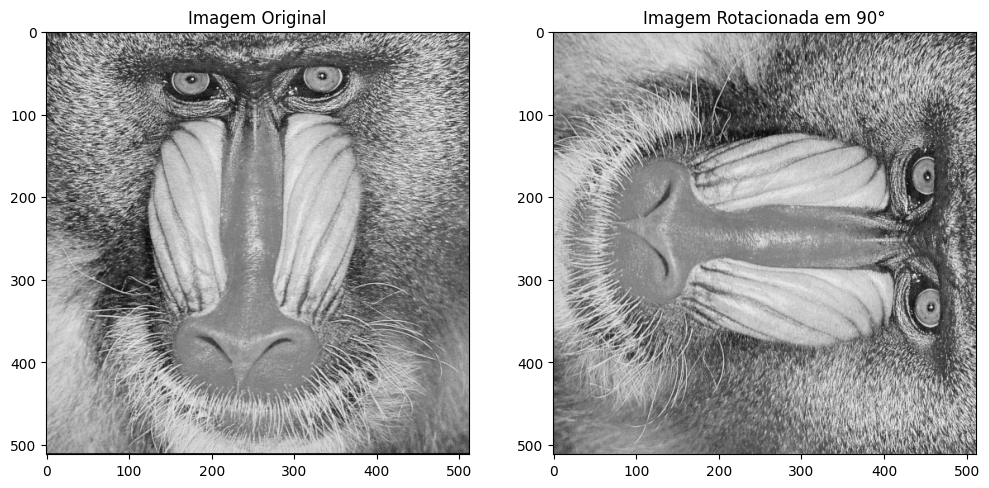

In [9]:
img = escolha_imagem(baboon_mono)

rotacao = int(input("- 1 para rotação de 90°\n- 2 para rotação de 180°\n- 3 para rotação de 270°\n"))


img_modificada = None
if rotacao == 1:
    #Rotação de 90°
    img_modificada = img[::-1].T

elif rotacao == 2:
    #Rotação de 180°
    img_modificada = img[::-1,::-1]

elif rotacao ==3:
    #Rotação de 270°
    img_modificada = img.T[::-1]

else:
    print("Opção inválida, rotação de 270° aplicada")
    img_modificada = img.T

plotar_imagem(img,img_modificada,f'Imagem Rotacionada em {rotacao*90}°')


# **Ampliação de Imagem por Replicação** (Nenhuma restrição na imagem)

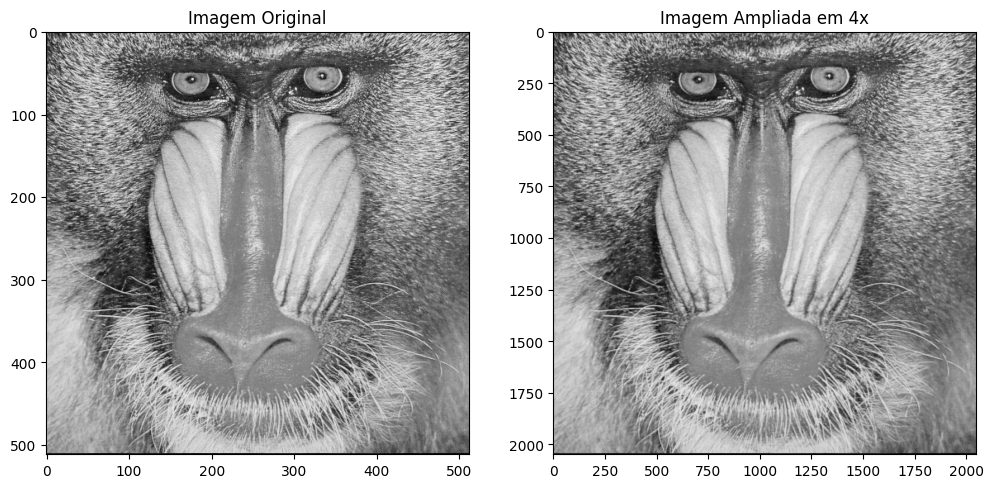

In [10]:
img = escolha_imagem(baboon_mono)

ampliacao = int(input("- 1 para ampliação 2x\n- 2 para ampliação 4x\n"))

#Essencialmente está repetindo no repeat interior as linhas e no repeat exterior
#está repetindo as colunas fator_ampliacao vezes
img_ampliada = np.repeat(np.repeat(img, ampliacao*2, axis=0), ampliacao*2, axis=1)

plotar_imagem(img,img_ampliada,f'Imagem Ampliada em {ampliacao*2}x')

# **Esboço a Lápis** (Imagem RGB)

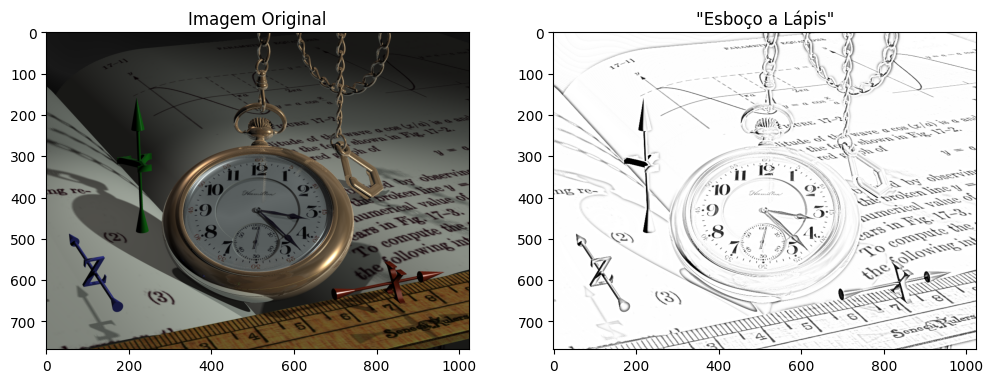

In [11]:
img = escolha_imagem(watch)

#Converter em cinza que aparece na letra b) da 1.8
coeficientes = [0.2989, 0.5870, 0.1140]
img_cinza = np.dot(img[..., :3], coeficientes)

#Filtro Gaussiano
img_filtrada = ndimage.gaussian_filter(img_cinza, sigma=3)

#Divisão
img_modificada = (img_cinza / img_filtrada)*255

#Garantir que os valores estão no intervalo correto
img_modificada = np.clip(img_modificada, 0, 255).astype(np.uint8)

plotar_imagem(img,img_modificada,f'"Esboço a Lápis"')

# **Ajuste de Brilho** (Imagem Monocromática)

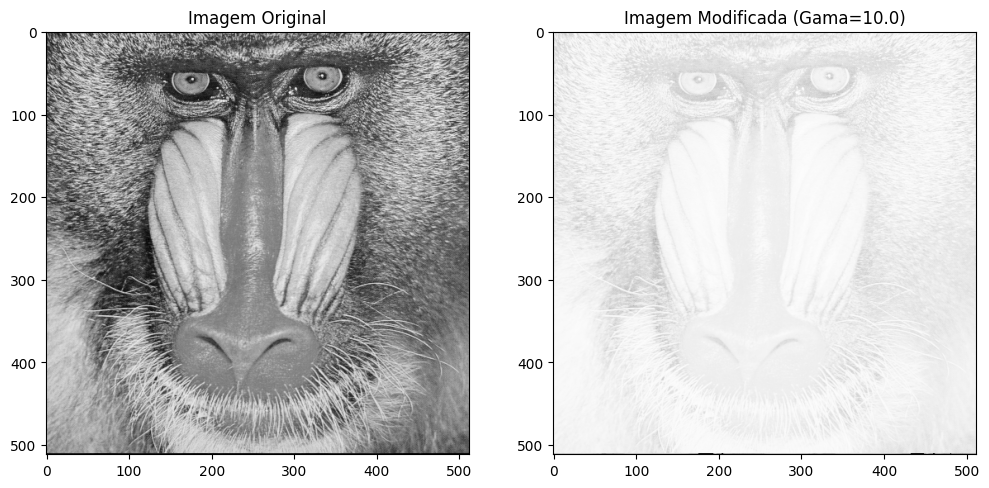

In [12]:
img = escolha_imagem(baboon_mono)
gama = float(input("Fator de alteração do brilho: "))

if img.max() > 1:
    img = img / 255.0

img_modificada = img**(1 / gama)

img_modificada = (img_modificada * 255).astype(np.uint8)

img_original_vga = (img * 255).astype(np.uint8)

plotar_imagem(img_original_vga, img_modificada, f'Imagem Modificada (Gama={gama})')

# **Binarização por Limiar** (Imagem monocromática)

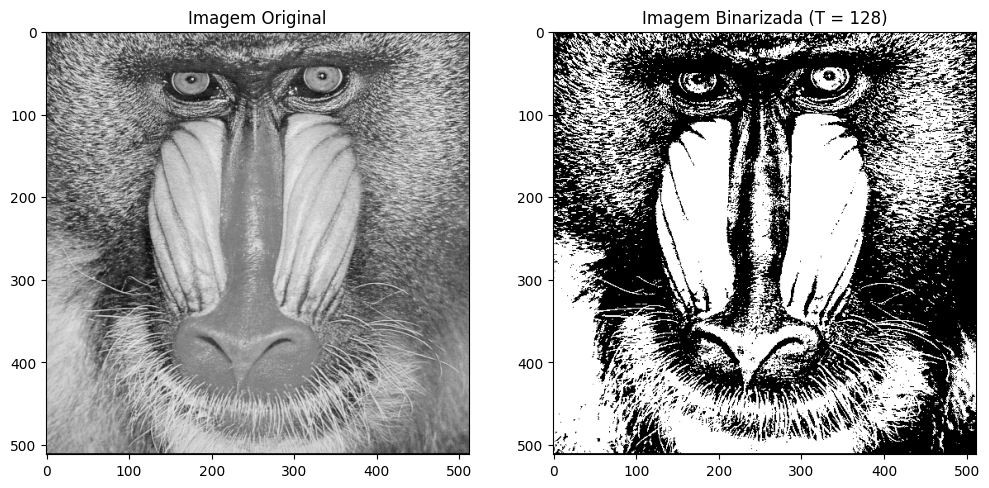

In [13]:
img = escolha_imagem(baboon_mono)

T = int(input("Limiar de Binzarização (Valor de 0 a 255): "))

img = normalizar_imagem(img)

img_modificada = img.copy()

#Binarização das imagens
img_modificada[img_modificada>T] = 255
img_modificada[img_modificada<T] = 0

plotar_imagem(img, img_modificada, f'Imagem Binarizada (T = {T})')

# **Mosaico** (Nenhuma restrição na imagem)


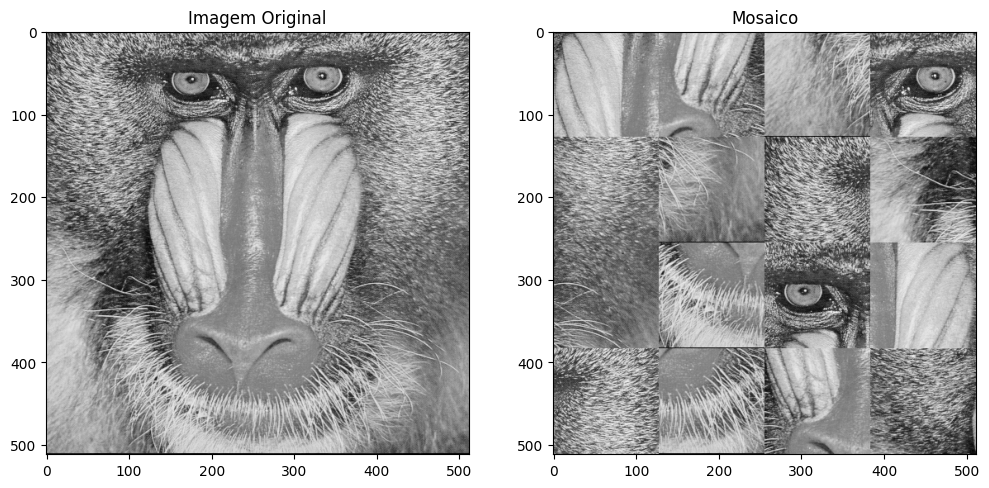

In [14]:
from numpy.random import randint
#Os loops for nesse caso foram usado para melhor legibilidade e são pequenos,
#cada um percorre somente 4 elementos(fora o for para gerar um mosaico aleatório
#que vai até 100 mas também não fariz diferença significativa fora não ser
#obrigatório), não deixando o código mais lento de forma significativa.

img = escolha_imagem(baboon_mono)

disposicao = int(input("1 - disposição do enunciado\n2 - disposição aleatória\n"))

#Separação da imagem original em pedaços
largura = img.shape[0]//4
altura = img.shape[1]//4
primeira_linha = [img[0:largura, i*altura:(i+1)*altura] for i in range(4)]
segunda_linha = [img[largura:2*largura, i*altura:(i+1)*altura] for i in range(4)]
terceira_linha = [img[2*largura:3*largura, i*altura:(i+1)*altura] for i in range(4)]
quarta_linha = [img[3*largura:4*largura, i*altura:(i+1)*altura] for i in range(4)]

#Organização em dicionário para melhor legibilidade
pecas = {}
contador = 1

linhas = [primeira_linha, segunda_linha, terceira_linha, quarta_linha]

for linha_pedaços in linhas:
    for pedaco in linha_pedaços:
        pecas[contador] = pedaco
        contador += 1


#Juntar todas as peças de acordo com a disposição do enunciado
if disposicao == 1:
    disposicao = [[6,11,13,3],[8,16,1,9],[12,14,2,7],[4,15,10,5]]
elif disposicao == 2:
    aleatorio = np.arange(1, 17)
    for i in range(100):
        a = randint(0, 16)
        b = randint(0, 16)
        aleatorio[a], aleatorio[b] = aleatorio[b], aleatorio[a]
    disposicao = aleatorio.reshape(4, 4).tolist()
    print(disposicao)
else:
    print("Opção inválida, disposição do enunciado aplicada")
    disposicao = [[6,11,13,3],[8,16,1,9],[12,14,2,7],[4,15,10,5]]

mosaico_linhas = []
for i in disposicao:
    linha = []
    for j in i:
        linha.append(pecas[j])
    linha = np.hstack(linha)
    mosaico_linhas.append(linha)

mosaico = np.vstack(mosaico_linhas)

plotar_imagem(img, mosaico, f'Mosaico')

# **Alteração de Cores** (Imagem RGB)


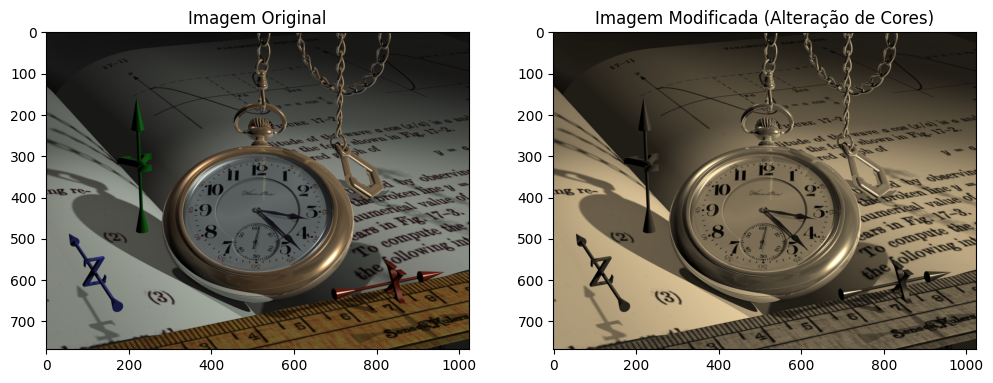

In [15]:
img = escolha_imagem(watch)

coeficientes = np.array([
    [0.393, 0.769, 0.189],
    [0.349, 0.686, 0.168],
    [0.272, 0.534, 0.131]
])

#Transformação inicial
img_modificada = (np.dot(img[..., :3], coeficientes.T)*255)

img_modificada = np.clip(img_modificada, 0, 255).astype(np.uint8)

plotar_imagem(img,img_modificada,f'Imagem Modificada (Alteração de Cores)')

# **Transformação de Imagens Coloridas** (Imagem RGB)



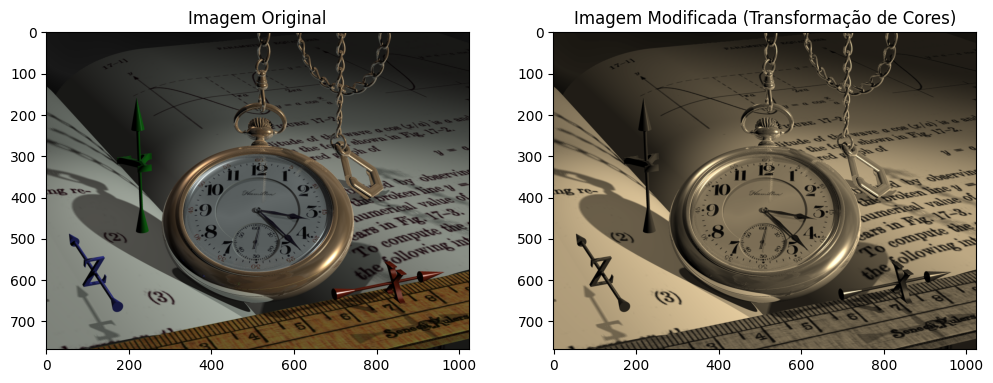

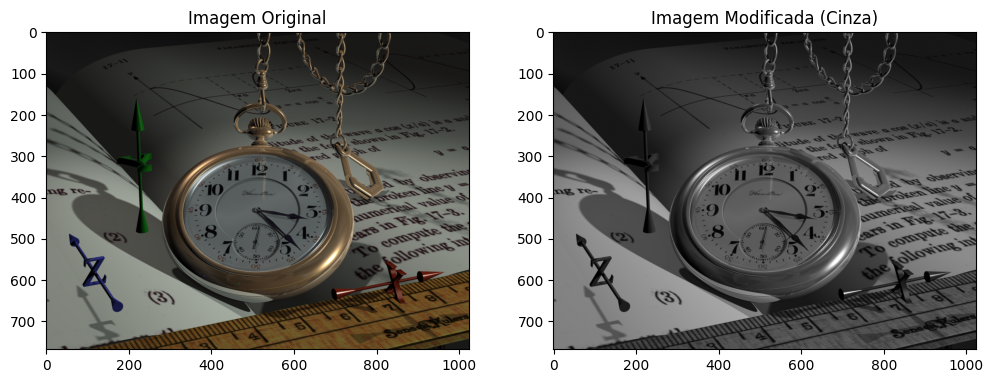

In [16]:
img = escolha_imagem(watch)

coeficientes = np.array([
    [0.393, 0.769, 0.189],
    [0.349, 0.686, 0.168],
    [0.272, 0.534, 0.131]
])

#Transformação inicial
img_modificada = np.dot(img[..., :3], coeficientes.T)

img_modificada[img_modificada > 1] = 1
img_modificada[img_modificada < 0] = 0

#Transformação para cinza
coeficientes = [0.2989, 0.5870, 0.1140]
img_cinza = np.dot(img[..., :3], coeficientes)

img_cinza[img_cinza > 1] = 1
img_cinza[img_cinza < 0] = 0


plotar_imagem(img, img_modificada, "Imagem Modificada (Transformação de Cores)")
plotar_imagem(img, img_cinza, "Imagem Modificada (Cinza)")

# **Plano de Bits** (Imagem monocromática)


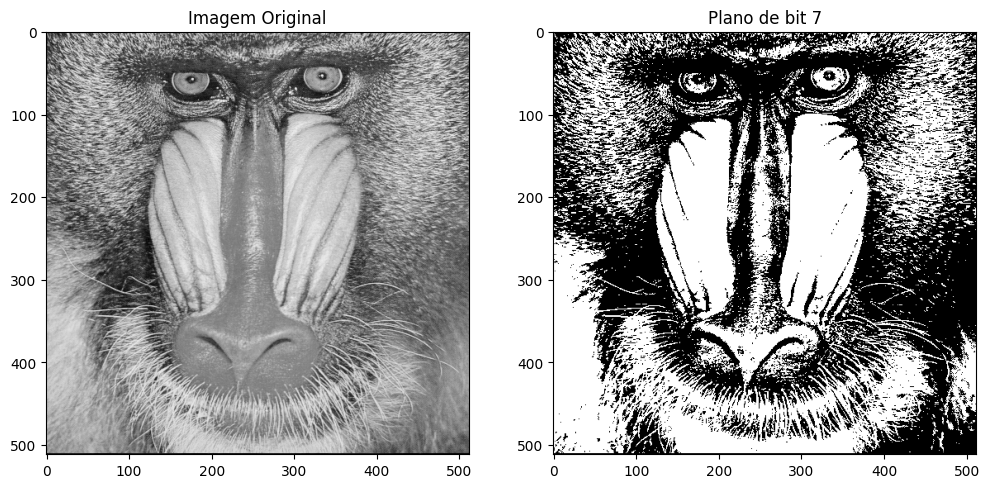

In [17]:
img = escolha_imagem(baboon_mono)

#Transformando em inteiro para operação de bitshift
img = normalizar_imagem(img)

layer = int(input("Posição do Bit (0-7):"))

img_modificada = ((img >> layer) & 1) * 255

plotar_imagem(img,img_modificada,f"Plano de bit {layer}")

# **Combinação de Imagens** (Imagens Monocromáticas)

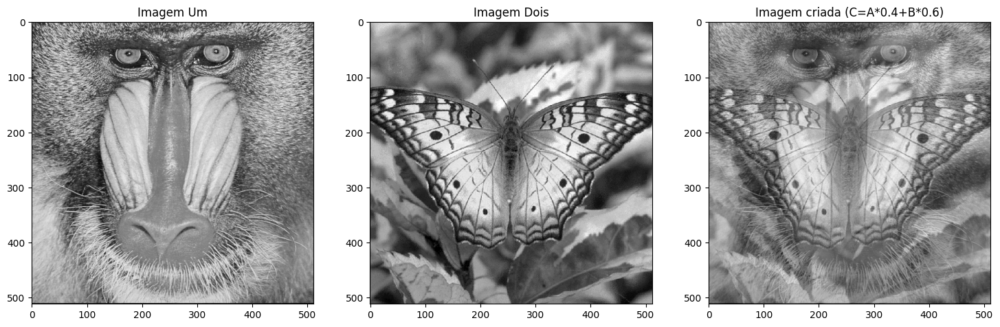

In [18]:
opcao = int(input("1 - Imagem de teste original\n2 - Imagem de teste escolhida\n"))
img_um = None
img_dois = None
if opcao == 1:
    img_um = baboon_mono.copy()
    img_dois = butterfly.copy()
elif opcao == 2:
    #Neste caso dado que tem duas imagens diferentes, será necessário mudar as
    #duas linhas abaixo para testar imagens diferentes
    img_um = plt.imread('teste.png')
    img_dois = plt.imread('teste2.png')
else:
    print("Opção inválida, imagens originais usadas")
    img_um = baboon_mono.copy()
    img_dois = butterfly.copy()


img_um = normalizar_imagem(img_um)
img_dois = normalizar_imagem(img_dois)

peso = float(input("Peso da primeira imagem (Segunda imagem é 1 - peso): "))

#Mistura das imagens
img_criada = img_um * peso + img_dois * (1 - peso)
img_criada[img_criada > 255] = 255

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

im1 = ax[0].imshow(img_um, cmap='gray')
ax[0].set_title('Imagem Um')

im2 = ax[1].imshow(img_dois, cmap='gray')
ax[1].set_title('Imagem Dois')

im3 = ax[2].imshow(img_criada, cmap='gray')
ax[2].set_title(f'Imagem criada (C=A*{peso}+B*{1-peso:.1f})')

plt.show()

# **Transformação de Intensidade** (Imagens monocromáticas)

**Letra B - Negativo da imagem**


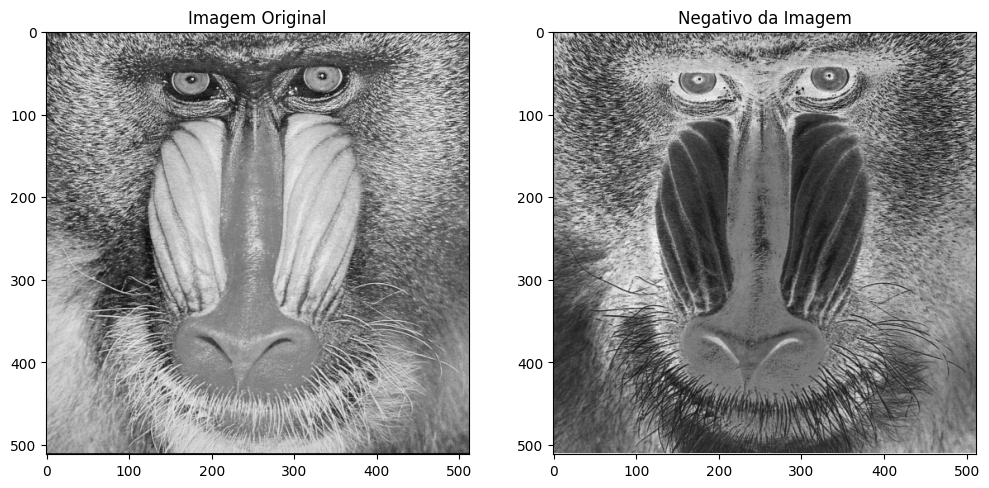

In [19]:
img = escolha_imagem(baboon_mono)

img = normalizar_imagem(img)

#Processo para fazer o negativo da imagem
img_modificada = abs(255 - img)

plotar_imagem(img, img_modificada, "Negativo da Imagem")

# **Transformação de Intensidade** (Imagens monocromáticas)

**Letra C - Mudança de intervalo da imagem**


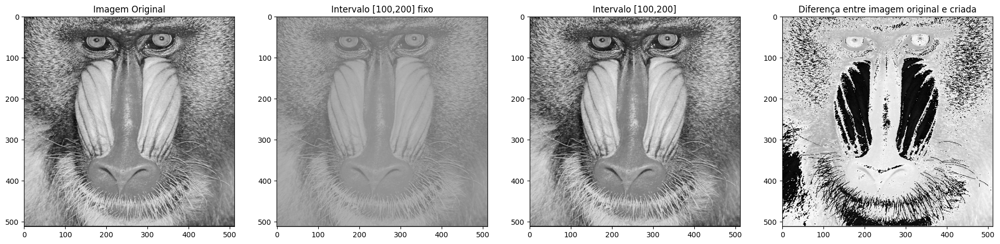

In [20]:
img = escolha_imagem(baboon_mono)

img = normalizar_imagem(img)

#Intervalo [a,b]
a, b = map(int, input("Limites do intervalo separado por espaço: ").split())

img_modificada = (((img)/255*(b-a)) + a).astype(np.uint8)
img_modificada = np.clip(img_modificada, a, b).astype(np.uint8)

#Para o efeito gerado na primeira imagem, é fixado o preto como 0 e o branco como 255
fig, ax = plt.subplots(1, 4, figsize=(24, 6))

im1 = ax[0].imshow(img, cmap='gray')
ax[0].set_title('Imagem Original')

im2 = ax[1].imshow(img_modificada, cmap='gray', vmin=0, vmax=255)
ax[1].set_title(f'Intervalo [{a},{b}] fixo')

im3 = ax[2].imshow(img_modificada, cmap='gray')
ax[2].set_title(f'Intervalo [{a},{b}]')

im3 = ax[3].imshow(img - img_modificada, cmap='gray')
ax[3].set_title(f'Diferença entre imagem original e criada')

plt.show()


# **Transformação de Intensidade** (Imagens monocromáticas)

**Letra D - Linhas pares invertidas**


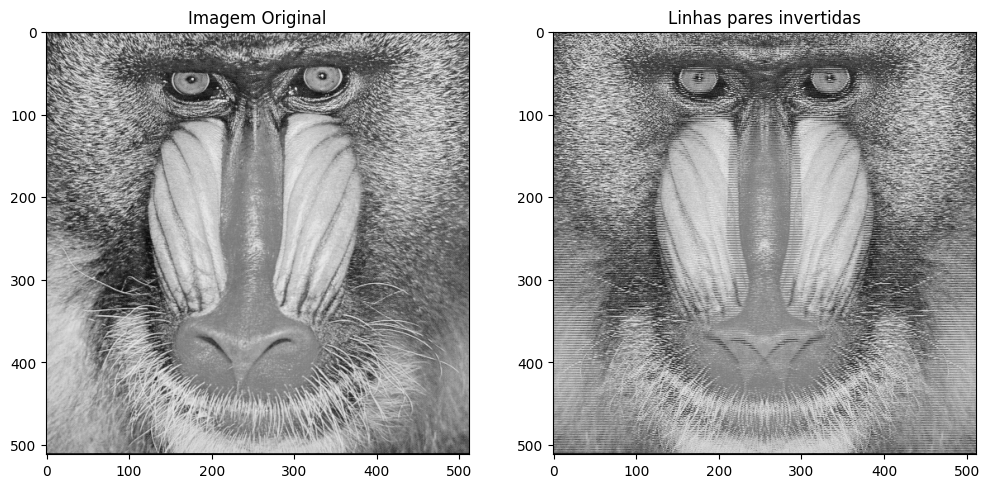

In [21]:
img = escolha_imagem(baboon_mono)

img_modificada = img.copy()

# Inverter os elementos dentro de cada linha da imagem original
img_invertida = img[:, ::-1]

# Obter os índices das linhas pares (0, 2, 4, ...)
indices_pares = np.arange(0, img.shape[0], 2)

# Substituir as linhas pares de img_modificada pelas linhas correspondentes com elementos invertidos
img_modificada[indices_pares, :] = img_invertida[indices_pares, :]

plotar_imagem(img, img_modificada, "Linhas pares invertidas")

# **Transformação de Intensidade** (Imagens monocromáticas)

**Letra E - Espelho horizontal**


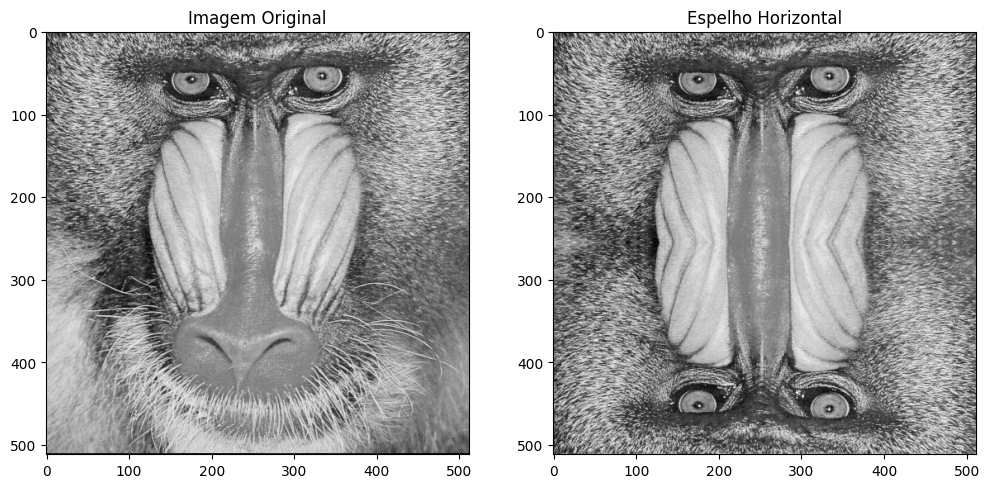

In [22]:
img = escolha_imagem(baboon_mono)

img_modificada = img.copy()
#Imagem original rotacionada em 180 graus
img_rotacionada = img_modificada[::-1]

#Índices metade inferior
indices_metade_inferior = np.arange(img.shape[0]//2, img.shape[0])

#Espelhamento da metade inferior
img_modificada[indices_metade_inferior, :] = img_rotacionada[indices_metade_inferior, :]

plotar_imagem(img, img_modificada, "Espelho Horizontal")

# **Transformação de Intensidade** (Imagens monocromáticas)

**Letra F - Espelho Vertical**

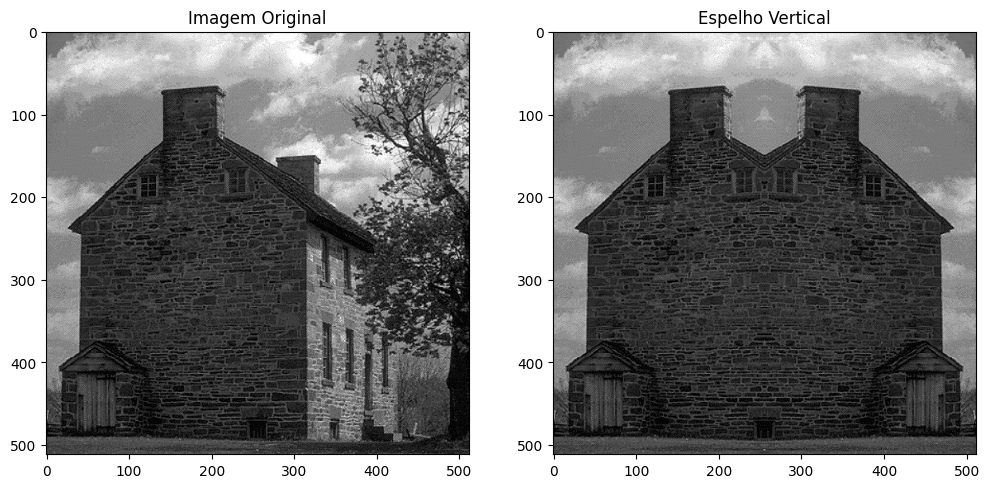

In [23]:
img = escolha_imagem(house)

img_modificada = img.copy()
#Imagem com elementos das linhas invertidos
img_rotacionada = img_modificada[:, ::-1]

#Índices metade direita
indices_metade_direita = np.arange(img.shape[1]//2, img.shape[1])

#Espelhamento da metade direita
img_modificada[:, indices_metade_direita] = img_rotacionada[:, indices_metade_direita]

plotar_imagem(img, img_modificada, "Espelho Vertical")

# **Quantização de Imagens** (Imagem Monocromática)

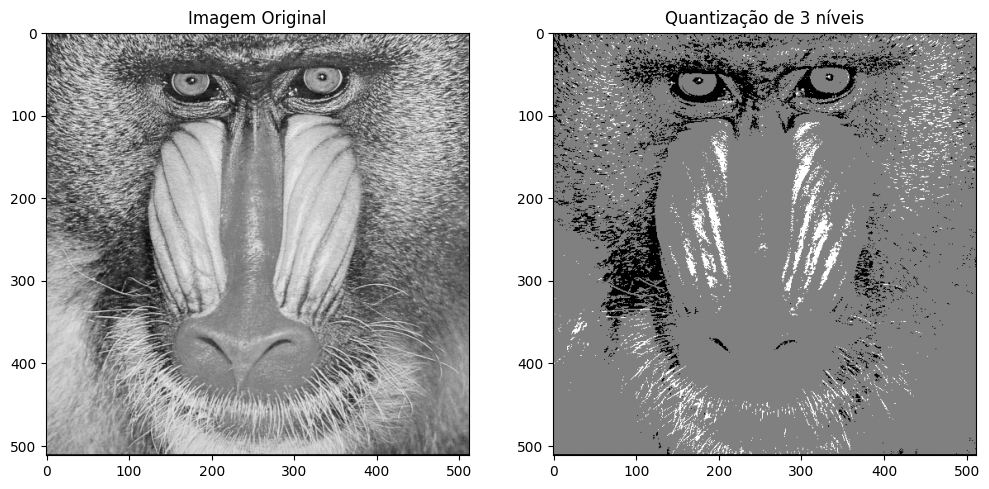

In [24]:
img = escolha_imagem(baboon_mono)

niveis_cinza = int(input("Número de níveis de cinza(0 a 255): "))

img_modificada = np.round((img) * (niveis_cinza-1)).astype(np.uint8)

plotar_imagem(img, img_modificada, f"Quantização de {niveis_cinza} níveis")

# **Filtragem de Imagens** (Imagem monocromática)


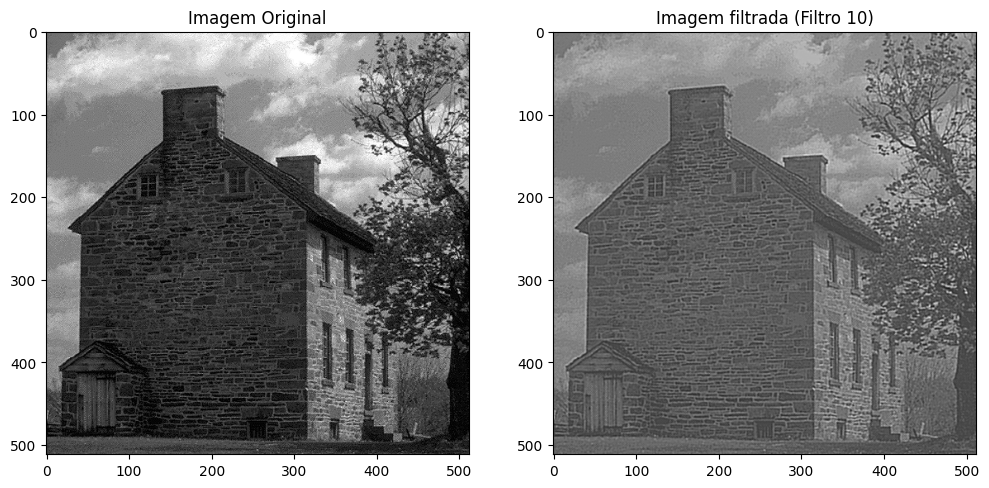

In [25]:
img = escolha_imagem(house)

num = int(input("Filtro desejado (12 para a expressão extra pedida): "))

#Definição de todas matrizes a serem usadas par ao filtro
filtros = {}
filtros[1] = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,16,-2,-1],[0,0,-1,0,0],[0,-1,-2,-1,0]])
filtros[2] = (1/256)*np.array([[1,4,6,4,1],[4,16,24,16,4],[6,24,36,24,6],[4,16,24,16,4],[1,4,6,4,1]])
filtros[3] = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
filtros[4] = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
filtros[5] = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
filtros[6] = (1/9)*np.array([[1,1,1],[1,1,1],[1,1,1]])
filtros[7] = np.array([[-1,-1,2],[-1,2,-1],[2,-1,-1]])
filtros[8] = np.array([[2,-1,-1],[-1,2,-1],[-1,-1, 2]])
filtros[9] = (1/9)*np.eye(9)
filtros[10] =  np.array([[-1,-1,-1,-1,-1],[-1,2,2,2,-1],[-1,2,8,2,-1],[-1,2,2,2,-1],[-1,-1,-1,-1,-1]])
filtros[11] = np.array([[-1,-1,0],[-1,0,1],[0,1,1]])

img_modificada = None

if(0 < num <= 11):
    img_modificada = ndimage.convolve(img, filtros[num], mode='nearest')

elif(num == 12):
    a = ndimage.convolve(img, filtros[3], mode='nearest')
    b = ndimage.convolve(img, filtros[4], mode='nearest')
    img_modificada = (a**2 + b**2)**(1/2)

else:
    print("Opção inválida, filtro 1 aplicado")
    num = 1
    img_modificada = ndimage.convolve(img, filtros[num], mode='nearest')

plotar_imagem(img,img_modificada,f"Imagem filtrada (Filtro {num})")